# Semantic Segmentation Models Benchmark

This notebook compares different configurations of the **SegFormer** model trained on the ForestSim dataset (24 semantic classes), with the goal of selecting the best configuration to use as the student/baseline network in the navigation pipeline.

For each model, the following are reported:
- **Training curves**: loss and metric trends on the train/validation sets;
- **Quantitative evaluation**: segmentation metrics (e.g. mIoU, per-class accuracy) and confusion matrix on the test set;
- **Qualitative evaluation**: visual examples of predictions on test images;
- **Performance benchmark**: model inference time and throughput.

The compared configurations vary in the **loss function** used during training (Dice + Cross-Entropy, Focal, Tversky).

In [1]:
import pandas as pd
import torch

from dataset.dataloader import ForestDataLoader
from dataset.transforms import ForestTransforms

from models.segformer import SegFormer

from training.metrics import Metrics

from evaluation.training_plots import TrainingPlots
from evaluation.qualitative_evaluation import QualitativeEvaluation
from evaluation.quantitative_evaluation import QuantitativeEvaluation
from evaluation.benchmark import Benchmark
from evaluation.plots import Plots
from training.logger import Logger

/home/inginf2026mardig/.virtualenvs/Forest_Semantic_Navigation/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

device

device(type='cuda')

In [3]:
test_transform = ForestTransforms(augmentation=False, train=False).get_transforms()
dataloader = ForestDataLoader(test_transform=test_transform)
dataloader.create_dataloaders()

print("Train:", len(dataloader.train_dataset))
print("Validation:", len(dataloader.validation_dataset))
print("Test:", len(dataloader.test_dataset))

Train: 1695
Validation: 189
Test: 209


In [4]:
metrics = Metrics(num_classes=24)

## SegFormer B1 — Dice + Cross-Entropy

**SegFormer B1** model (higher capacity than B0) trained with combined **Dice + Cross-Entropy** loss, to evaluate the impact of greater model capacity given the same loss function.

In [ ]:
model = SegFormer().get_model()

In [5]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.328469,0.905448,0.00006,0.780620,0.156955,0.211462,0.148182,0.638174
1,2,0.869815,0.756569,0.00006,0.812194,0.180495,0.253760,0.178606,0.684352
2,3,0.755725,0.690779,0.00006,0.836614,0.221028,0.301031,0.214292,0.733459
3,4,0.698331,0.654987,0.00006,0.849638,0.228147,0.310453,0.221853,0.748058
4,5,0.663637,0.626686,0.00006,0.856864,0.236511,0.322987,0.230072,0.761339


In [6]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.328432,0.404079,0.000001,0.902558,0.363948,0.511317,0.367467,0.828761
146,147,0.330192,0.405159,0.000001,0.902418,0.364840,0.511821,0.368225,0.828669
147,148,0.330698,0.404650,0.000001,0.902512,0.362593,0.509173,0.366868,0.828493
148,149,0.328631,0.403471,0.000001,0.902582,0.364783,0.512589,0.367674,0.829047
149,150,0.329922,0.403971,0.000001,0.902581,0.364162,0.511638,0.368057,0.828919


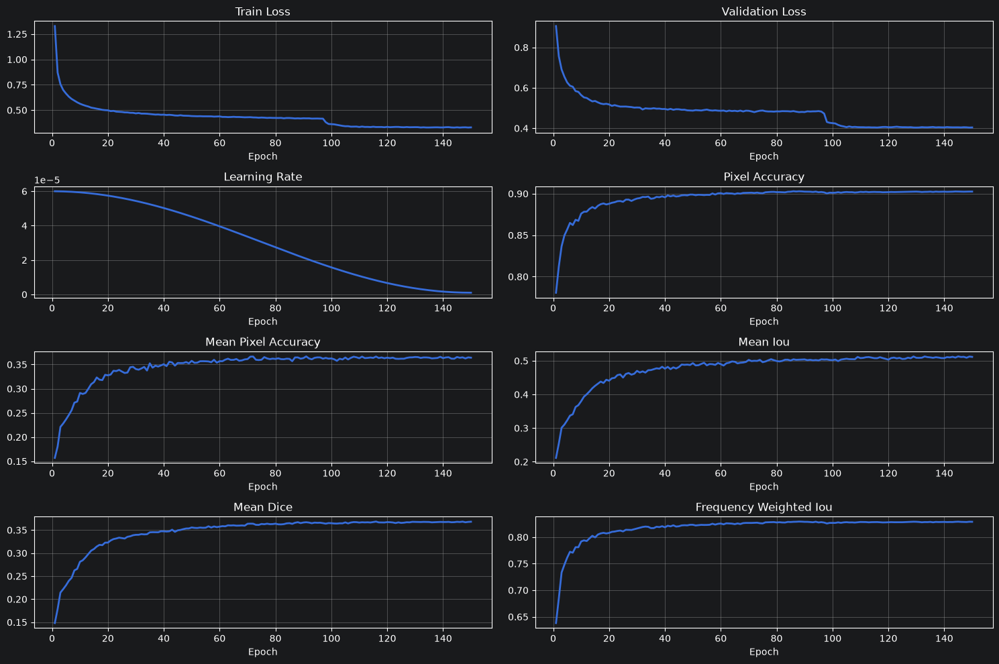

In [7]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [10]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8957
Mean Pixel Accuracy   : 0.3323
Mean IoU              : 0.4951
Mean Dice             : 0.3367
Frequency Weighted IoU: 0.8199

IoU per class:
Class 0: 0.7358
Class 1: 0.8036
Class 2: 0.4765
Class 3: 0.9081
Class 4: 0.8248
Class 5: 0.0000
Class 6: 0.4043
Class 7: 0.8526
Class 8: 0.7554
Class 9: 0.6953
Class 10: 0.6760
Class 11: 0.7235
Class 12: N/A
Class 13: N/A
Class 14: 0.6326
Class 15: 0.5596
Class 16: N/A
Class 17: 0.7023
Class 18: 0.1382
Class 19: 0.3705
Class 20: 0.1879
Class 21: 0.7935
Class 22: 0.7172
Class 23: 0.8769


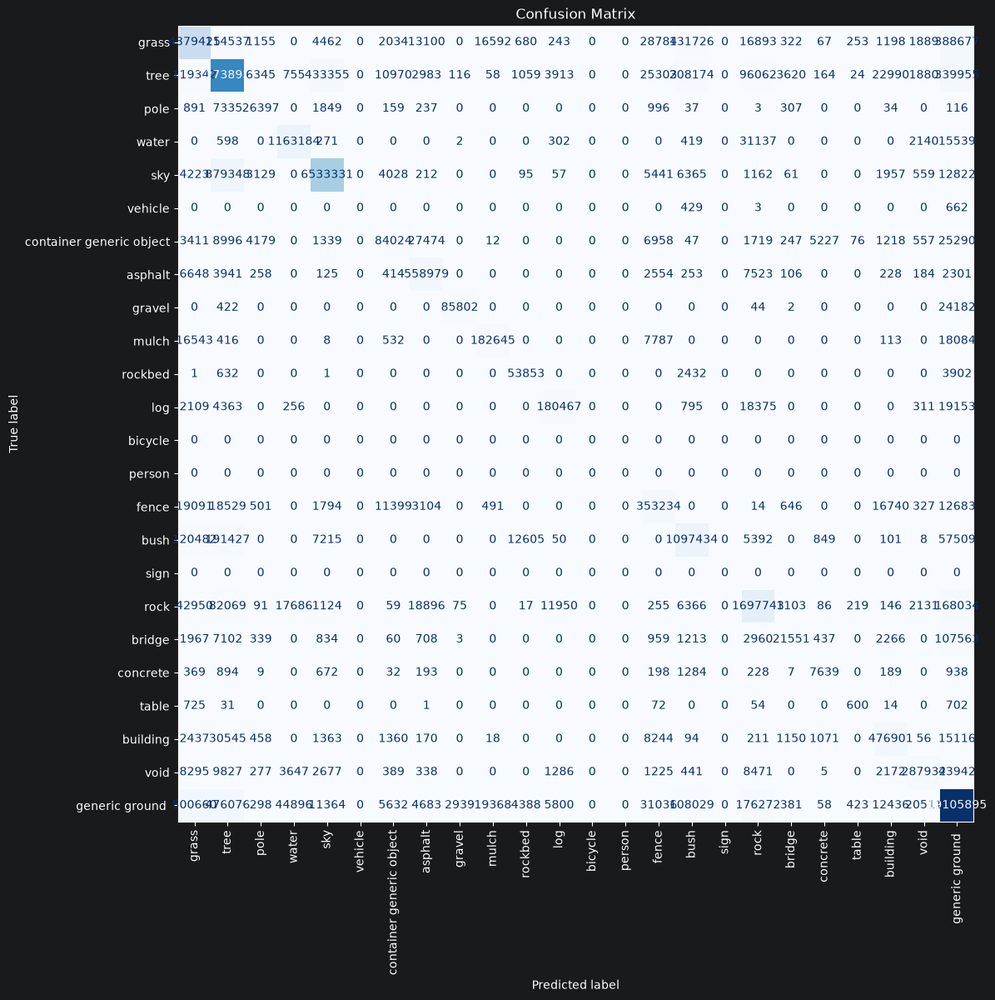

In [11]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

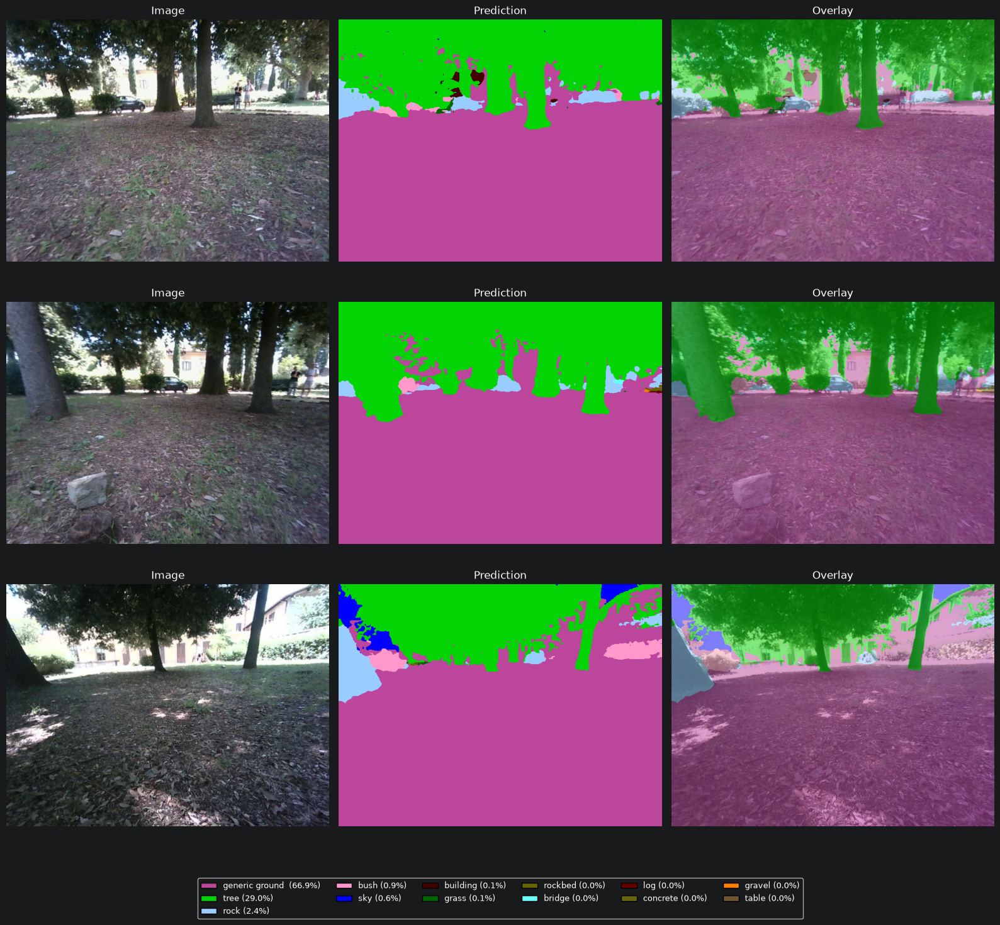

In [12]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [13]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.23
Throughput           : 665.85 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Tversky

**SegFormer B1** model trained with **Tversky** loss, to evaluate the impact of model capacity given the loss function.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.916815,0.860608,0.00006,0.775886,0.179263,0.238890,0.171954,0.640703
1,2,0.840503,0.825758,0.00006,0.789346,0.195251,0.249379,0.179204,0.668657
2,3,0.814808,0.796238,0.00006,0.822691,0.222589,0.302773,0.216952,0.714564
3,4,0.787232,0.778334,0.00006,0.833467,0.237662,0.310814,0.226209,0.729724
4,5,0.772238,0.767602,0.00006,0.839993,0.253036,0.322070,0.238062,0.737707


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.413345,0.458866,0.000001,0.885487,0.347673,0.468120,0.347677,0.802921
146,147,0.413987,0.458756,0.000001,0.885656,0.347611,0.466595,0.347794,0.803025
147,148,0.417181,0.460257,0.000001,0.885591,0.343837,0.471918,0.346378,0.802628
148,149,0.415507,0.459356,0.000001,0.885479,0.346054,0.471499,0.347113,0.802757
149,150,0.415456,0.459278,0.000001,0.885353,0.345818,0.469503,0.347220,0.802718


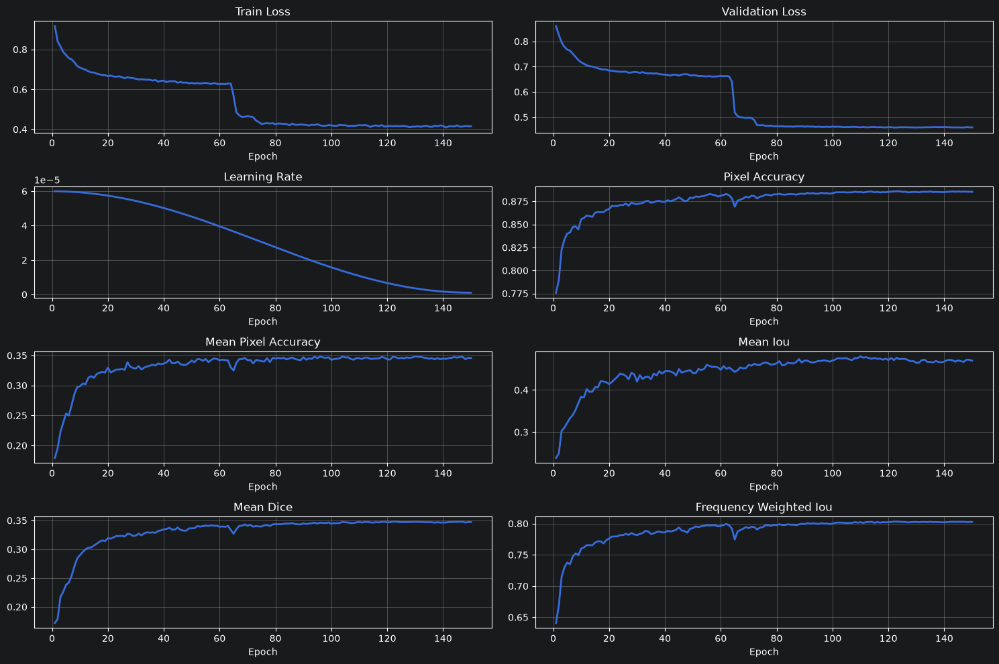

In [8]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8775
Mean Pixel Accuracy   : 0.3190
Mean IoU              : 0.4640
Mean Dice             : 0.3211
Frequency Weighted IoU: 0.7925

IoU per class:
Class 0: 0.7051
Class 1: 0.7808
Class 2: 0.4882
Class 3: 0.9020
Class 4: 0.8152
Class 5: 0.0000
Class 6: 0.4104
Class 7: 0.8261
Class 8: 0.0000
Class 9: 0.6977
Class 10: 0.6997
Class 11: 0.6899
Class 12: N/A
Class 13: N/A
Class 14: 0.5846
Class 15: 0.5384
Class 16: N/A
Class 17: 0.6813
Class 18: 0.1054
Class 19: 0.3548
Class 20: 0.0000
Class 21: 0.8194
Class 22: 0.0442
Class 23: 0.8482


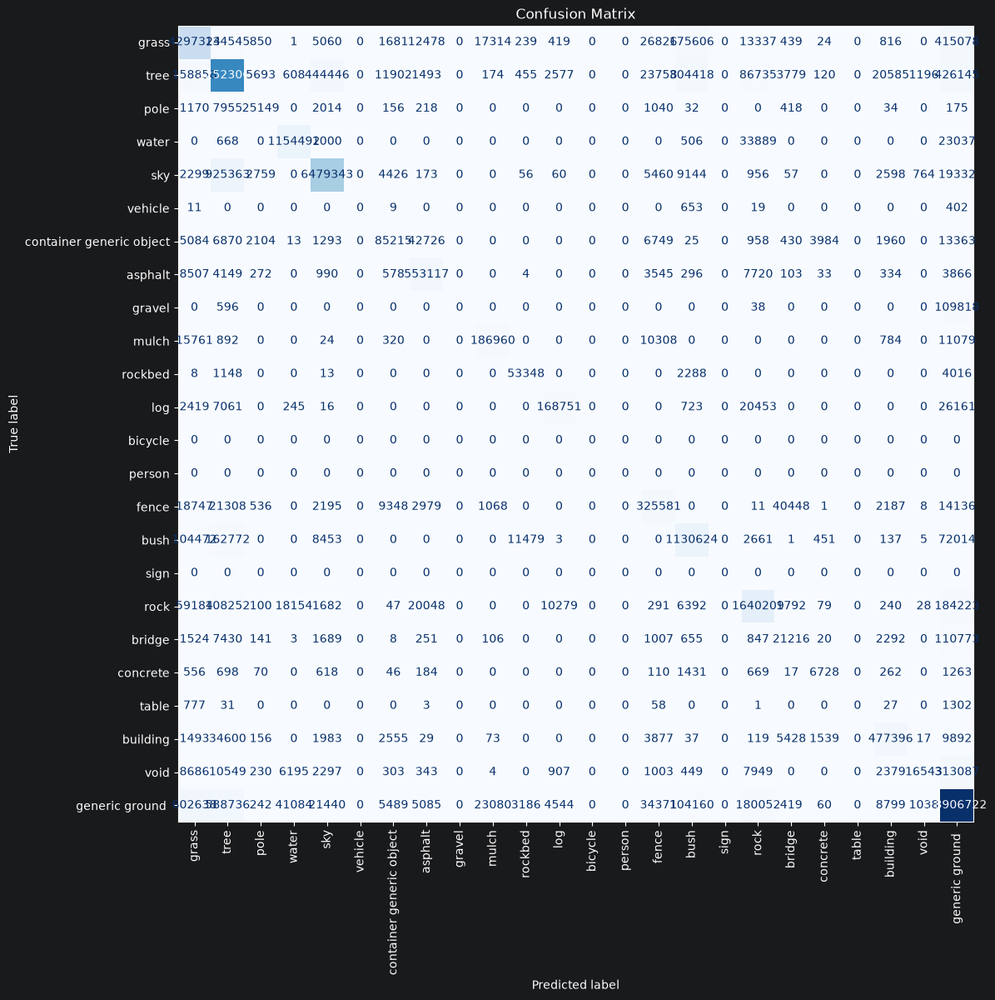

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

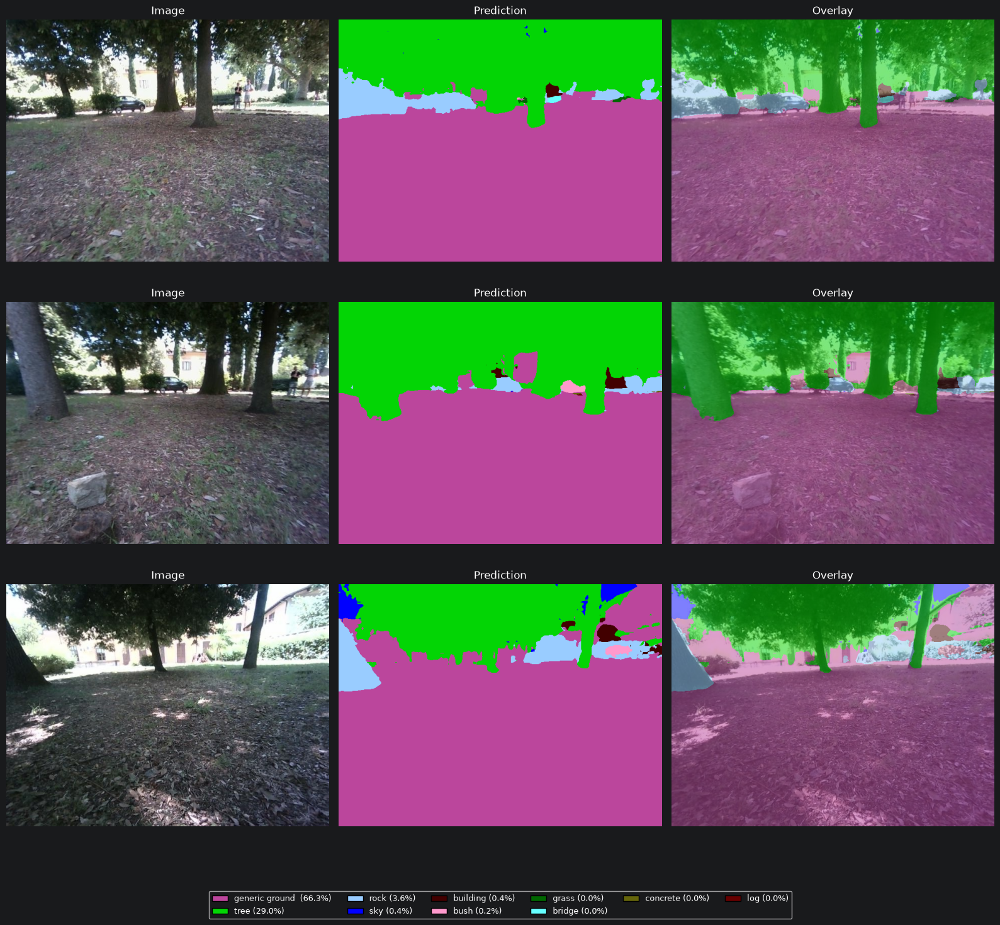

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [12]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.29
Throughput           : 666.32 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Focal

**SegFormer B1** model trained with **Focal** loss, to evaluate the impact of model capacity.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.260938,0.560468,0.00006,0.783907,0.172875,0.139925,0.167009,0.651115
1,2,0.501528,0.352833,0.00006,0.828741,0.204182,0.170414,0.201117,0.713798
2,3,0.369933,0.291666,0.00006,0.845271,0.224420,0.187360,0.219281,0.740996
3,4,0.306941,0.255197,0.00006,0.855071,0.234066,0.196880,0.231250,0.758332
4,5,0.265041,0.234215,0.00006,0.859227,0.241982,0.205354,0.241522,0.761835


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.074417,0.133942,0.000001,0.904132,0.343684,0.302335,0.353860,0.830623
146,147,0.074060,0.133799,0.000001,0.904147,0.344452,0.302760,0.354418,0.830648
147,148,0.074664,0.134687,0.000001,0.904047,0.343063,0.302168,0.353759,0.830285
148,149,0.074248,0.134273,0.000001,0.904065,0.343101,0.302011,0.353487,0.830435
149,150,0.075612,0.134546,0.000001,0.904055,0.343925,0.302413,0.353980,0.830402


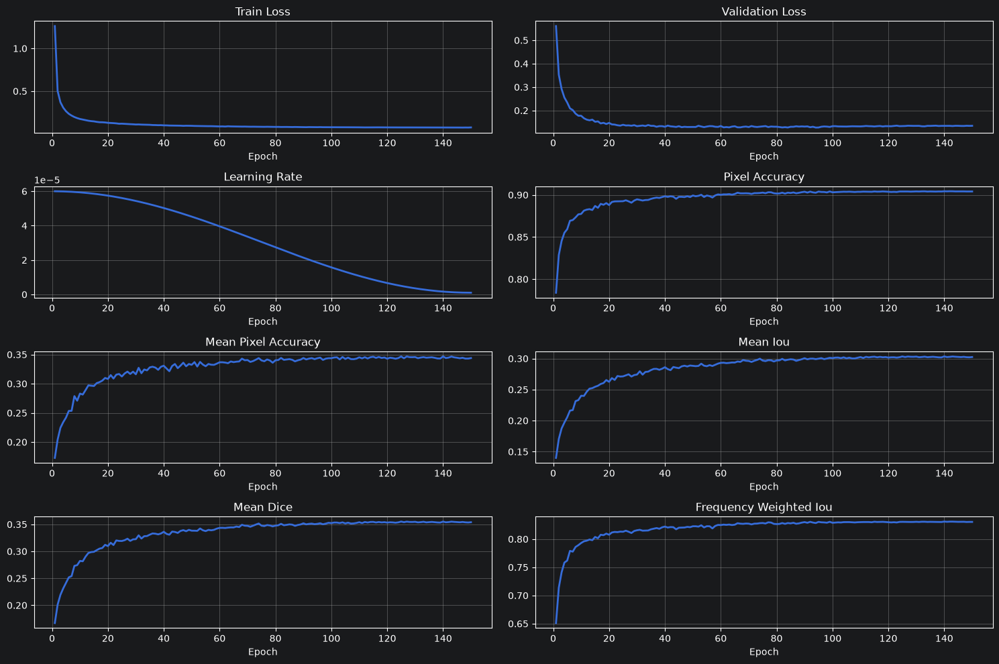

In [8]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8940
Mean Pixel Accuracy   : 0.3171
Mean IoU              : 0.4802
Mean Dice             : 0.3227
Frequency Weighted IoU: 0.8177

IoU per class:
Class 0: 0.7357
Class 1: 0.8033
Class 2: 0.4489
Class 3: 0.9073
Class 4: 0.8234
Class 5: 0.0000
Class 6: 0.3634
Class 7: 0.8733
Class 8: 0.7338
Class 9: 0.7048
Class 10: 0.6805
Class 11: 0.6988
Class 12: N/A
Class 13: N/A
Class 14: 0.5984
Class 15: 0.5512
Class 16: N/A
Class 17: 0.6891
Class 18: 0.1244
Class 19: 0.3983
Class 20: 0.1207
Class 21: 0.8084
Class 22: 0.7065
Class 23: 0.8752


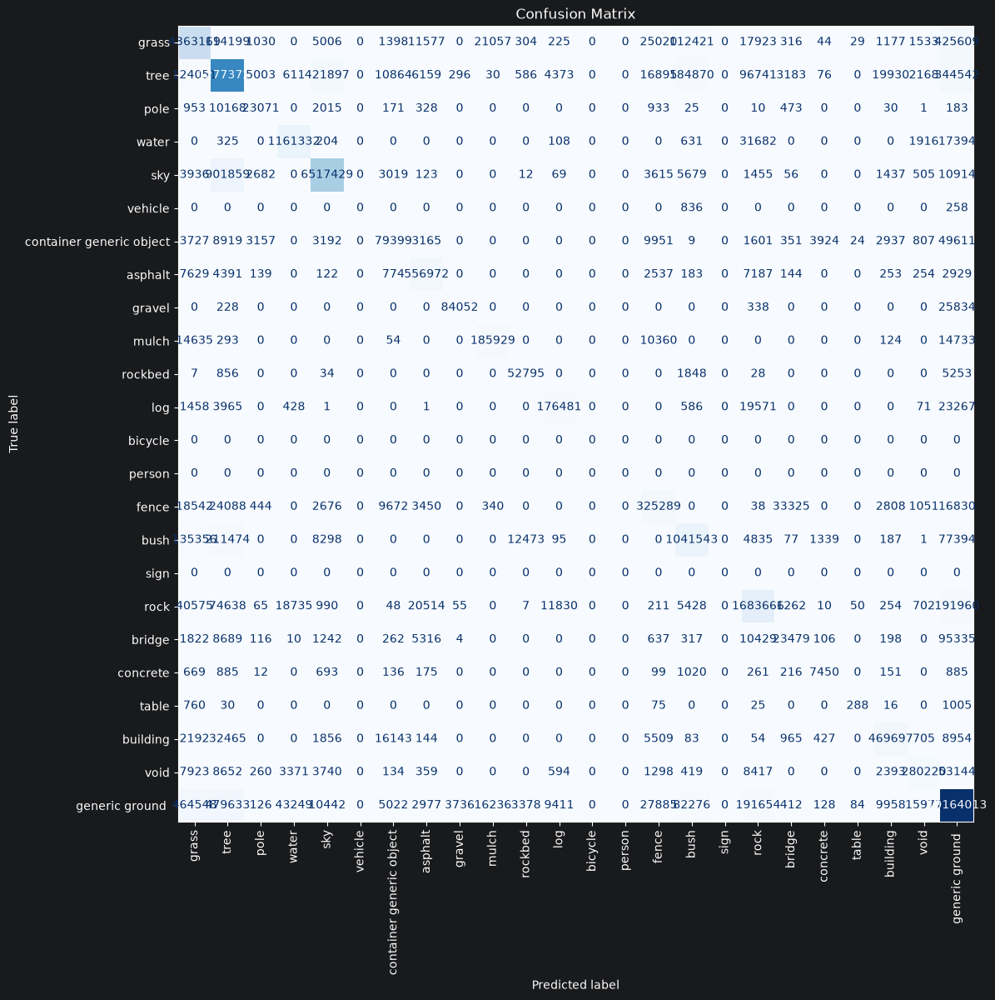

In [11]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

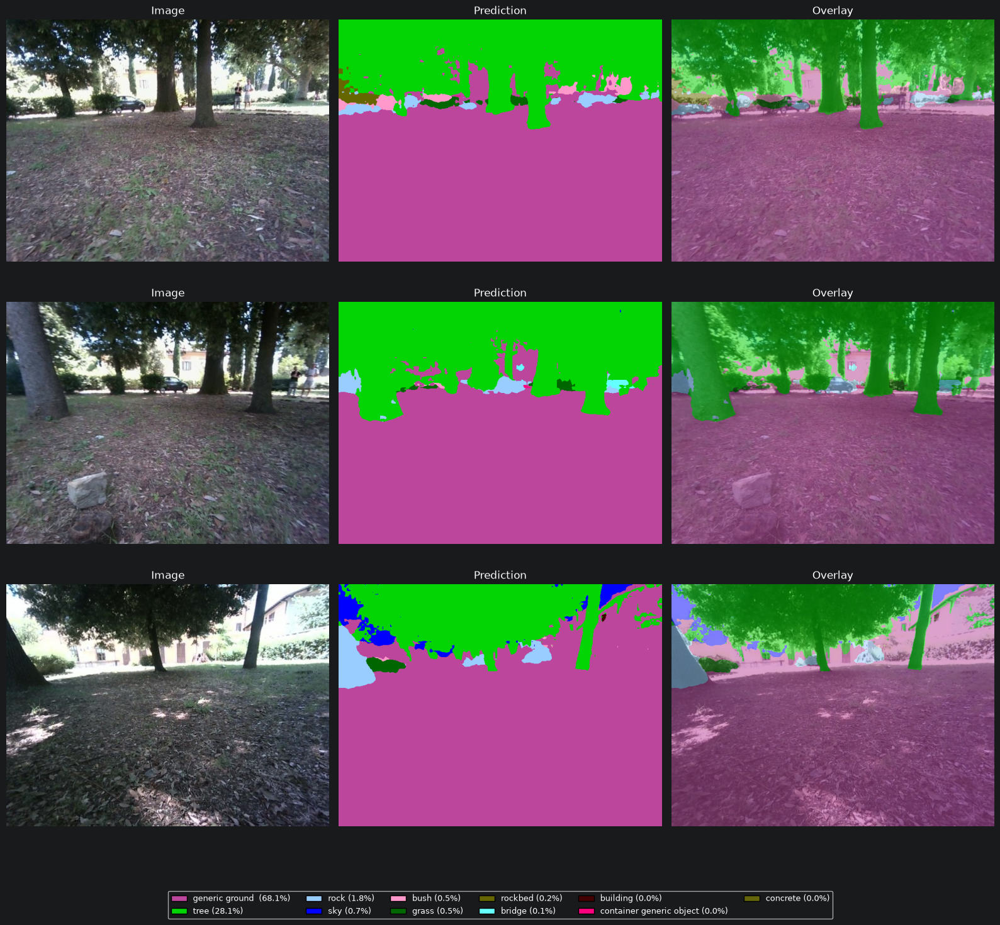

In [12]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [13]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.30
Throughput           : 666.37 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Dice

**SegFormer B1** model trained with **Dice** loss, to evaluate the impact of model capacity.

In [ ]:
model = SegFormer().get_model()

In [ ]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

In [ ]:
logs.tail()

In [ ]:
plots = TrainingPlots()

plots.plot_all()

In [ ]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()

In [ ]:
plots.confusion_matrix(results["confusion_matrix"])

In [ ]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [ ]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)